# Bonus Excericise 

In [11]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

### Sharpening Filter

In [12]:
def showim(img):
    plt.figure(figsize=(8,6))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()
    
def showim_subplot(imgs, nrows=1, ncols=2):
    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(22, 16))
    
    for ax, img in zip(axs, imgs):
        ax.imshow(img, cmap='gray')
        ax.axis('off')

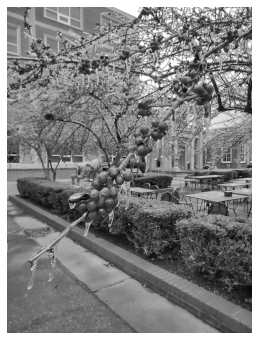

In [18]:
img = cv2.imread("beans.jpg", cv2.IMREAD_GRAYSCALE)

showim(img)

#### Using low pass filter

Attenuates high-frquency signals

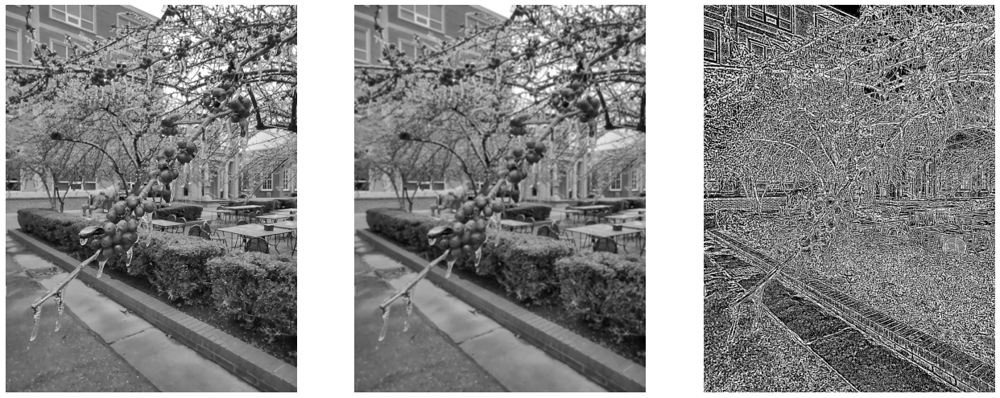

In [19]:
low_pass = (1/49) * np.ones((7, 7), np.float32)
filtered_img = cv2.filter2D(img, -1, low_pass)
details = img - filtered_img
showim_subplot([img, filtered_img, details], ncols=3)

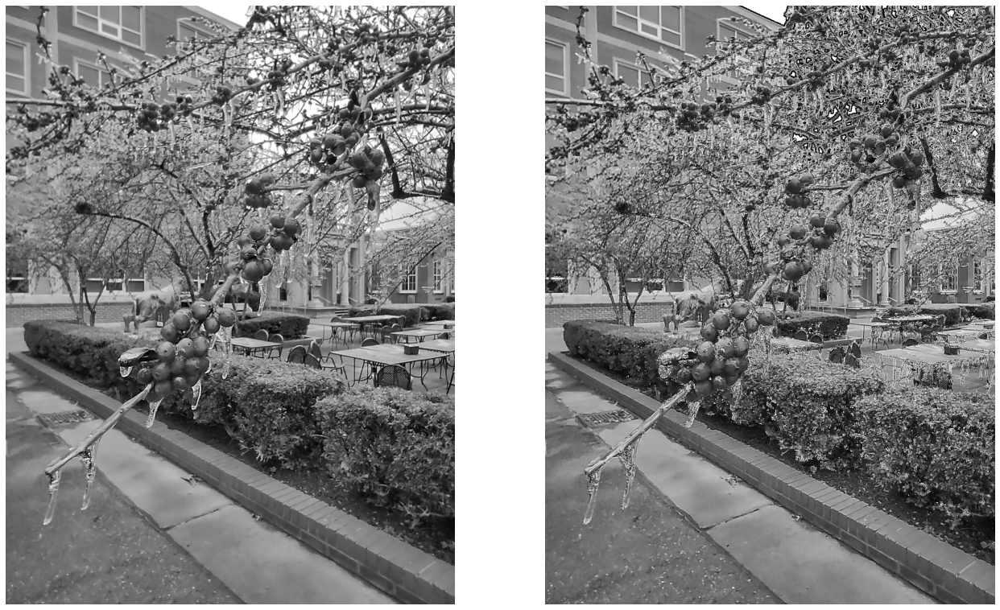

In [20]:
sharp_img = img + details
showim_subplot([img, sharp_img])

High pass attenuates low-frequency signals

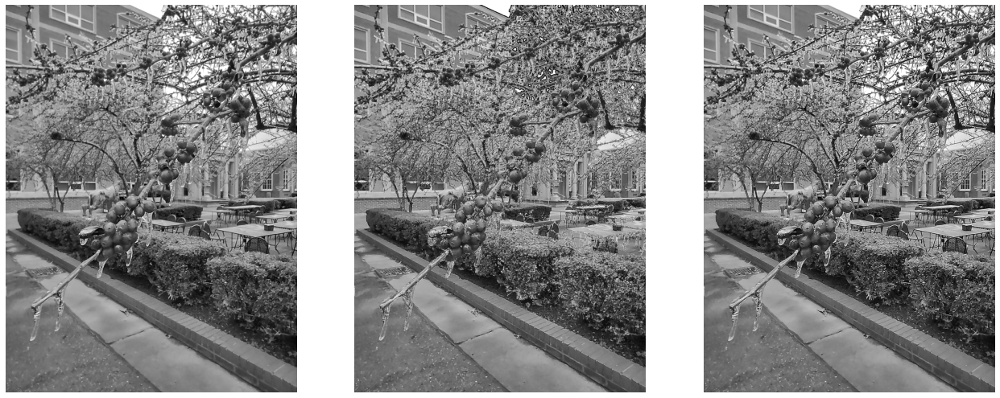

In [21]:
high_pass = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])

filtered_img = cv2.filter2D(img, -1, high_pass)

showim_subplot([img, sharp_img, filtered_img], ncols=3)

## Canny Edge Detection

<h6>Steps</h6>

<ul>
    <li>Noise Reduction</li>
    <li>Sobel Filter/ Gradient Calculation</li>
    <li>Non-maximum suppression</li>
    <li>Double threshold</li>
    <li>Edge Tracking (Hysteresis)</li>
</ul>

Details (from wiki)

<ul>
The process of Canny edge detection algorithm can be broken down to five different steps:

1. Apply Gaussian filter to smooth the image in order to remove the noise <br>
2. Find the intensity gradients of the image  <br>
3. Apply gradient magnitude thresholding or lower bound cut-off suppression to get rid of spurious response to edge detection <br>
4. Apply double threshold to determine potential edges <br>
5. Track edge by hysteresis: Finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.<br>

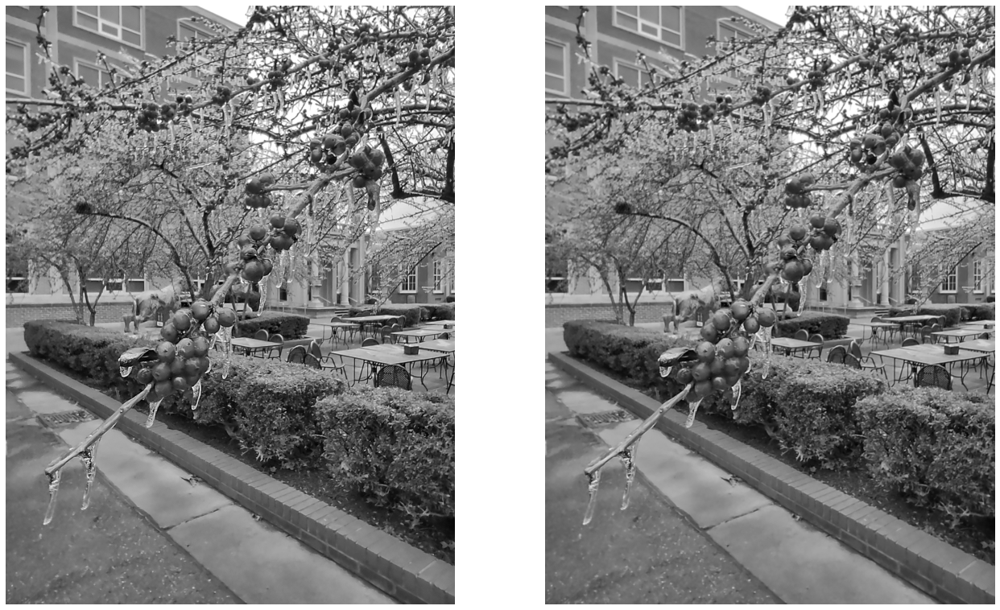

In [24]:
img = cv2.imread("beans.jpg", cv2.IMREAD_GRAYSCALE)
filtered_img = cv2.GaussianBlur(img, (3,3), 1, 1)

showim_subplot([img, filtered_img])

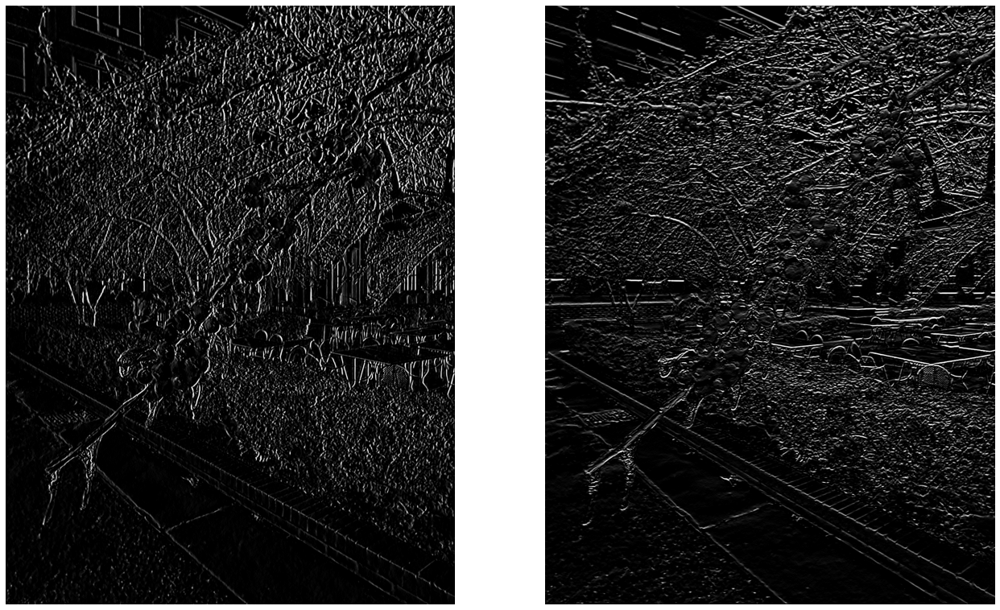

In [25]:
Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

Ix = cv2.filter2D(filtered_img, -1, Kx)
Iy = cv2.filter2D(filtered_img, -1, Ky)

showim_subplot([Ix, Iy])

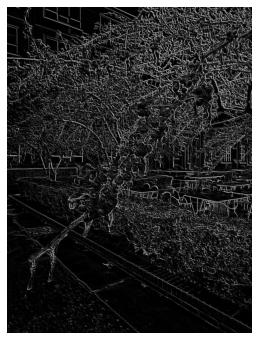

In [26]:
G = np.hypot(Ix, Iy)
G = G / G.max() * 255
G = G.astype(np.uint8)
theta = np.arctan2(Iy, Ix)

showim(G)

In [27]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

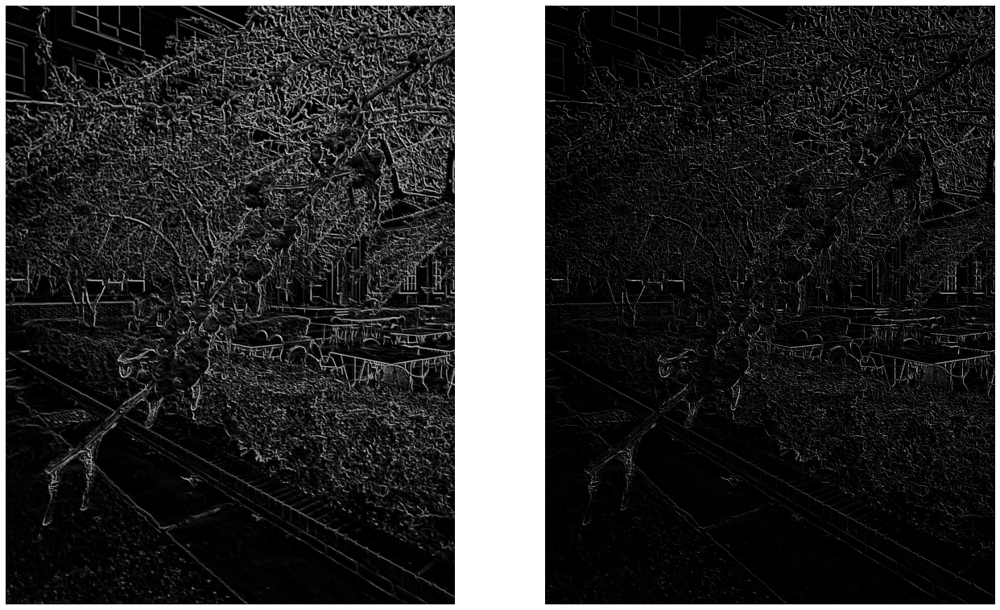

In [28]:
img_supressed = non_max_suppression(G, theta)
showim_subplot([G, img_supressed])

In [30]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):
    
    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;
    print(highThreshold, lowThreshold)
    
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    
    weak = np.int32(60)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)
    
    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    
    return res, strong, weak

25.5 5.1000000000000005


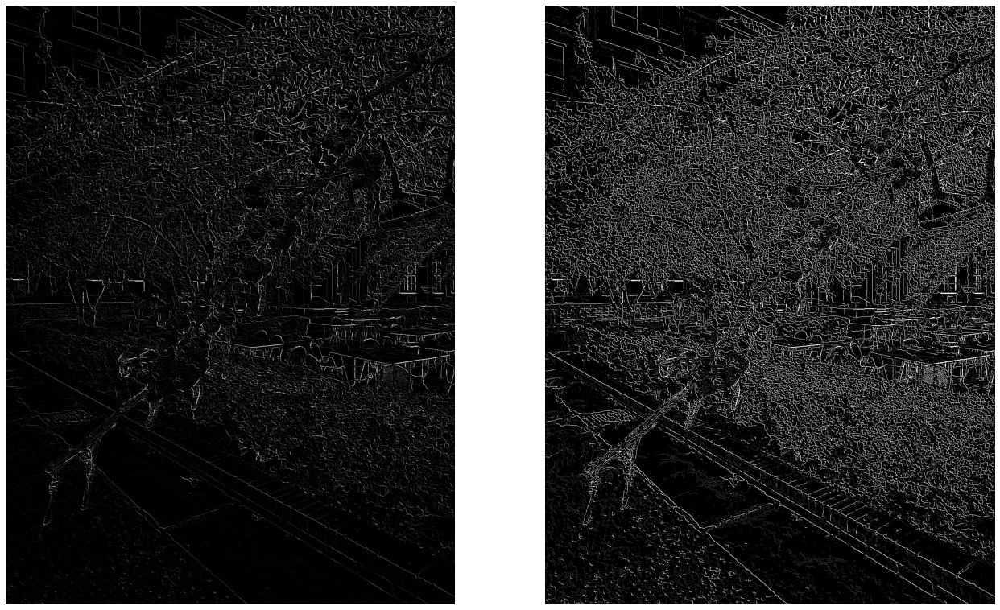

In [31]:
img_thr, strong, weak = threshold(img_supressed, 0.2, 0.1)

showim_subplot([img_supressed, img_thr])

In [32]:
def hysteresis(img, weak, strong=255):
    M, N = img.shape
    f_img = img.copy()
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (f_img[i,j] == weak):
                try:
                    if ((f_img[i+1, j-1] == strong) or (f_img[i+1, j] == strong) or (f_img[i+1, j+1] == strong)
                        or (f_img[i, j-1] == strong) or (f_img[i, j+1] == strong)
                        or (f_img[i-1, j-1] == strong) or (f_img[i-1, j] == strong) or (f_img[i-1, j+1] == strong)):
                        f_img[i, j] = strong
                    else:
                        f_img[i, j] = 0
                except IndexError as e:
                    pass
    return f_img

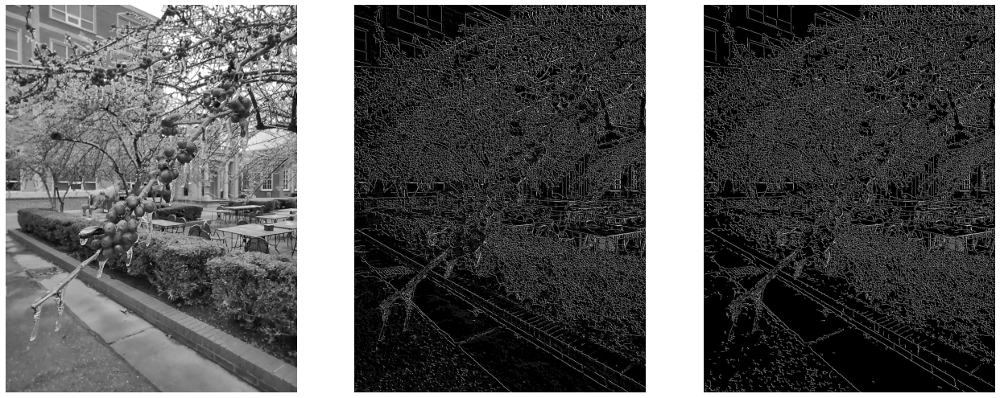

In [33]:
final = hysteresis(img_thr, weak)
showim_subplot([img,img_thr, final], ncols=3)

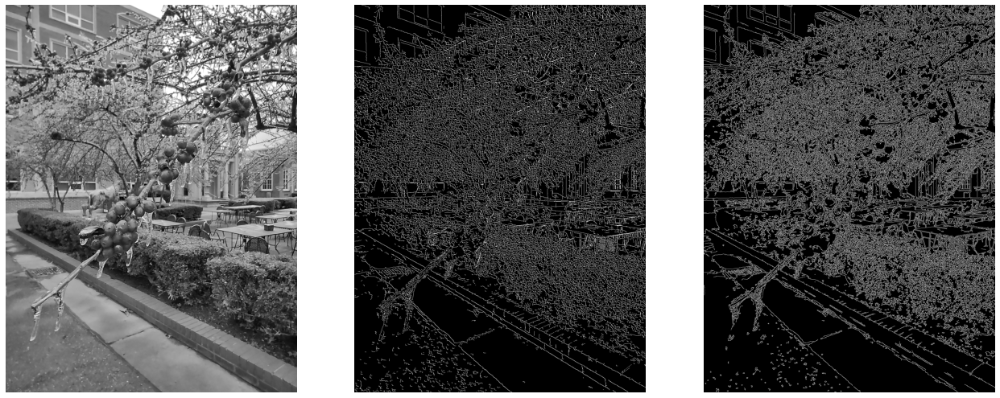

In [34]:
final_cv2 = cv2.Canny(img, 50, 160)

showim_subplot([img,final,final_cv2], ncols=3)